# STEP 1

###### observations from the raw data as in the excel file: 

There are several columns with all zeros and several with all ones. There are several columns with most values missing. 

Below is just a simple code taken off of: 
https://stackoverflow.com/questions/9031783/hide-all-warnings-in-ipython

to try and hide all the warning 

In [1]:
from IPython.display import HTML
HTML('''<script>
code_show_err=false; 
function code_toggle_err() {
 if (code_show_err){
 $('div.output_stderr').hide();
 } else {
 $('div.output_stderr').show();
 }
 code_show_err = !code_show_err
} 
$( document ).ready(code_toggle_err);
</script>
To toggle on/off output_stderr, click <a href="javascript:code_toggle_err()">here</a>.''')

In [2]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(color_codes = True)


In [3]:
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

In [4]:
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier

In [5]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.decomposition import PCA 
from sklearn.pipeline import Pipeline 

In [6]:
signal = pd.read_csv('signal-data.csv')

In [7]:
signal

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,2899.41,2464.36,2179.7333,3085.3781,1.4843,100.0,82.2467,0.1248,1.3424,...,203.1720,0.4988,0.0143,0.0039,2.8669,0.0068,0.0138,0.0047,203.1720,-1
1563,2008-10-16 20:49:00,3052.31,2522.55,2198.5667,1124.6595,0.8763,100.0,98.4689,0.1205,1.4333,...,NaN,0.4975,0.0131,0.0036,2.6238,0.0068,0.0138,0.0047,203.1720,-1
1564,2008-10-17 05:26:00,2978.81,2379.78,2206.3000,1110.4967,0.8236,100.0,99.4122,0.1208,NaN,...,43.5231,0.4987,0.0153,0.0041,3.0590,0.0197,0.0086,0.0025,43.5231,-1
1565,2008-10-17 06:01:00,2894.92,2532.01,2177.0333,1183.7287,1.5726,100.0,98.7978,0.1213,1.4622,...,93.4941,0.5004,0.0178,0.0038,3.5662,0.0262,0.0245,0.0075,93.4941,-1


As observed many sensors seem to have missing values, all values as 1s, 0s and mostly missing values. There seems to be a time element which has not yet been tested for correlation with the target variable. 

In [8]:
signal.describe()

,0,1,2,3,4,5,6,7,8,9,...,581,582,583,584,585,586,587,588,589,Pass/Fail
count,1561.000000,1560.000000,1553.000000,1553.000000,1553.000000,1553.0,1553.000000,1558.000000,1565.000000,1565.000000,...,618.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1567.000000
mean,3014.452896,2495.850231,2200.547318,1396.376627,4.197013,100.0,101.112908,0.121822,1.462862,-0.000841,...,97.934373,0.500096,0.015318,0.003847,3.067826,0.021458,0.016475,0.005283,99.670066,-0.867262
std,73.621787,80.407705,29.513152,441.691640,56.355540,0.0,6.237214,0.008961,0.073897,0.015116,...,87.520966,0.003404,0.017180,0.003720,3.578033,0.012358,0.008808,0.002867,93.891919,0.498010
min,2743.240000,2158.750000,2060.660000,0.000000,0.681500,100.0,82.131100,0.000000,1.191000,-0.053400,...,0.000000,0.477800,0.006000,0.001700,1.197500,-0.016900,0.003200,0.001000,0.000000,-1.000000
25%,2966.260000,2452.247500,2181.044400,1081.875800,1.017700,100.0,97.920000,0.121100,1.411200,-0.010800,...,46.184900,0.497900,0.011600,0.003100,2.306500,0.013425,0.010600,0.003300,44.368600,-1.000000
50%,3011.490000,2499.405000,2201.066700,1285.214400,1.316800,100.0,101.512200,0.122400,1.461600,-0.001300,...,72.288900,0.500200,0.013800,0.003600,2.757650,0.020500,0.014800,0.004600,71.900500,-1.000000
75%,3056.650000,2538.822500,2218.055500,1591.223500,1.525700,100.0,104.586700,0.123800,1.516900,0.008400,...,116.539150,0.502375,0.016500,0.004100,3.295175,0.027600,0.020300,0.006400,114.749700,-1.000000
max,3356.350000,2846.440000,2315.266700,3715.041700,1114.536600,100.0,129.252200,0.128600,1.656400,0.074900,...,737.304800,0.509800,0.476600,0.104500,99.303200,0.102800,0.079900,0.028600,737.304800,1.000000


many sensors seem to have a waste range and many minimum values seem to extended into the negative side. 

Many appeear

## IDENTIFYING REDUNDANCIES IN THE DATASET like - all 1s, 0s or NaNs

In [9]:
sig = pd.read_csv('signal-data.csv')

In [10]:
sig

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,2899.41,2464.36,2179.7333,3085.3781,1.4843,100.0,82.2467,0.1248,1.3424,...,203.1720,0.4988,0.0143,0.0039,2.8669,0.0068,0.0138,0.0047,203.1720,-1
1563,2008-10-16 20:49:00,3052.31,2522.55,2198.5667,1124.6595,0.8763,100.0,98.4689,0.1205,1.4333,...,NaN,0.4975,0.0131,0.0036,2.6238,0.0068,0.0138,0.0047,203.1720,-1
1564,2008-10-17 05:26:00,2978.81,2379.78,2206.3000,1110.4967,0.8236,100.0,99.4122,0.1208,NaN,...,43.5231,0.4987,0.0153,0.0041,3.0590,0.0197,0.0086,0.0025,43.5231,-1
1565,2008-10-17 06:01:00,2894.92,2532.01,2177.0333,1183.7287,1.5726,100.0,98.7978,0.1213,1.4622,...,93.4941,0.5004,0.0178,0.0038,3.5662,0.0262,0.0245,0.0075,93.4941,-1


Let's drop the unevaluable dimensions 

In [11]:
sig.drop(['Time','Pass/Fail'],axis = 1, inplace = True)

# STEP 3 
(step 2 is performed further ahead)

In [15]:
feat = list(signal)[0:-1]
plt.figure(figsize=(100,370))
j=1
for i in feat: 
    plt.subplot(100,6,j)
    sns.distplot(signal[i])
    j+=1

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level functi

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level functi

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

Several signal have extrememly skewed distributions and most seem to have normal. Some have abnormal distributions which all call for a powerful prediction algorithm. 

In [12]:
##### miss_treat_1

from sklearn.impute import SimpleImputer
rep_nan = SimpleImputer(missing_values=np.nan, strategy="median")
cols=sig.columns
sig = pd.DataFrame(rep_nan.fit_transform(sig))

###### Below is an attempt to trace out all the columns with only zero values. 

In [13]:
zero_df = sig.loc[:, (sig == 0).all()] #### axis is 0 by default which is along the index/rows. 

In [14]:
zero_df

,13,52,97,141,149,178,179,186,189,190,...,529,530,531,532,533,534,535,536,537,538
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1563,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1564,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1565,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
all_zero_cols = zero_df.columns
all_0_cols = pd.DataFrame(all_zero_cols)

In [16]:
one_df = sig.loc[:,(sig == 1).all()]

###### Similarly for columns with all 1s. 

In [17]:
one_df

,49,69
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,1.0,1.0
4,1.0,1.0
...,...,...
1562,1.0,1.0
1563,1.0,1.0
1564,1.0,1.0
1565,1.0,1.0


In [18]:
all_1_cols = one_df.columns
all_1_cols = pd.DataFrame(all_1_cols)

In [19]:
cols_2_remove = pd.concat([all_0_cols, all_1_cols],axis = 0)
cols_2_remove

,0
0,13
1,52
2,97
3,141
4,149
...,...
109,536
110,537
111,538
0,49


###### Therefore now we have a list of columns/features with no variations to explain the result currently. 

In [20]:
cols_2_remove.reset_index(inplace = True)

In [21]:
cols_2_remove.drop(['index'],axis = 1,inplace = True)

In [22]:
 cols_2_remove

,0
0,13
1,52
2,97
3,141
4,149
...,...
109,536
110,537
111,538
112,49


In [23]:
sign = pd.read_csv('signal-data.csv')

In [24]:
df_nan = sign.isna()

In [25]:
df_nan.drop(['Time','Pass/Fail'], axis = 1, inplace = True)

###### Below is a dataframe tracing out the absence of values in each column. 

In [26]:
df_nan

,0,1,2,3,4,5,6,7,8,9,...,580,581,582,583,584,585,586,587,588,589
0,False,False,False,False,False,False,False,False,False,False,...,True,True,False,False,False,False,True,True,True,True
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,True,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1563,False,False,False,False,False,False,False,False,False,False,...,True,True,False,False,False,False,False,False,False,False
1564,False,False,False,False,False,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
1565,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [27]:
nan_feat = list(df_nan)
print(nan_feat)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', '157', '15

###### Below we're going to be plotting the percentage of missing values and present values in each feature and visually try to identify each feature with out numbering missing values. 

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


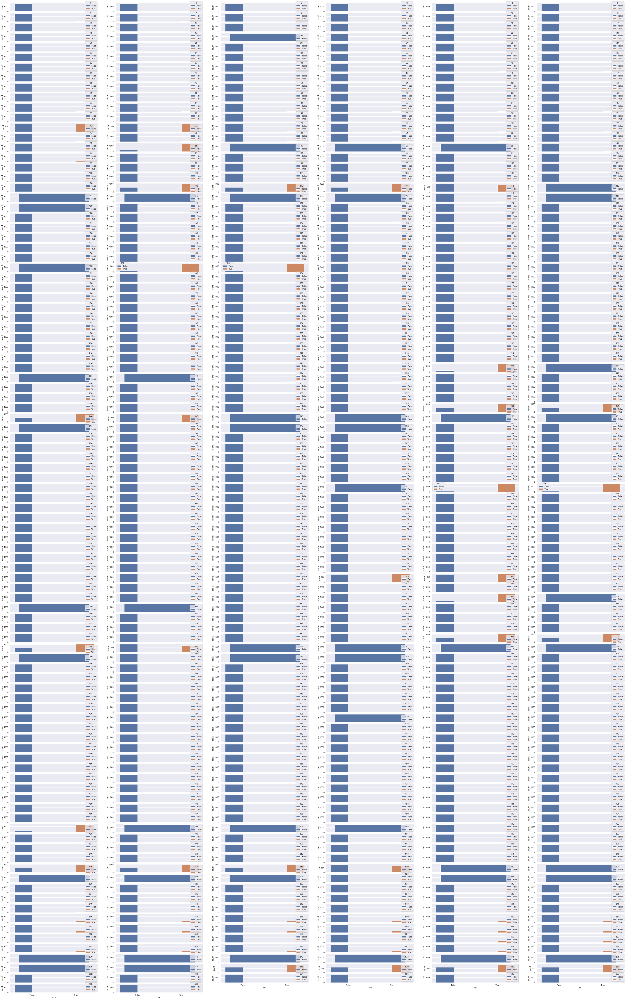

In [28]:
plt.figure(figsize=(60,100))
j = 1

for i in nan_feat: 
    plt.subplot(100,6,j)
    sns.countplot(df_nan[i],hue = df_nan[i])
    j+=1

###### The above plot might seem to daunting or inconveniently too vast to comprehend but it's just simply a plot for each feature comparing the number of missing values and non - missing values. 

If the number of missing values outnumbers or equals those not missing in column then it might in the model's best interests to drop such a column. 

In [29]:
pd.DataFrame(df_nan['0'].value_counts()) 

,0
False,1561
True,6


In [30]:
nan_cols = []
for i in list(df_nan): #iterating through each column/feature
    tru_val = df_nan[i].values.sum() # sum of all truly missing values. 
    fal_val = (~df_nan[i].values).sum() # sum of all 'false' for missing values. 
    if tru_val >= fal_val:
         print('')
         print(f'{i}')
         nan_cols.append(i)
    elif tru_val >= 0.75*fal_val:
         print('')
         print(f'{i}')
         nan_cols.append(i)
    elif tru_val == fal_val:
         print('')
         print(f'{i}')
         nan_cols.append(i)
    else:
         pass


72

73

85

109

110

111

112

157

158

220

244

245

246

247

292

293

345

346

358

382

383

384

385

492

516

517

518

519

578

579

580

581


In [31]:
nan_cols

['72',
 '73',
 '85',
 '109',
 '110',
 '111',
 '112',
 '157',
 '158',
 '220',
 '244',
 '245',
 '246',
 '247',
 '292',
 '293',
 '345',
 '346',
 '358',
 '382',
 '383',
 '384',
 '385',
 '492',
 '516',
 '517',
 '518',
 '519',
 '578',
 '579',
 '580',
 '581']

###### Therefore below we have 32 columns from the whole dataset which have outnumbering or bordering-on-half missing values. 

In [32]:
len(nan_cols)

32

###### Below is a plot of the number of missing and present values in each feature containing missing values. 

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Vishak\anaconda3\li

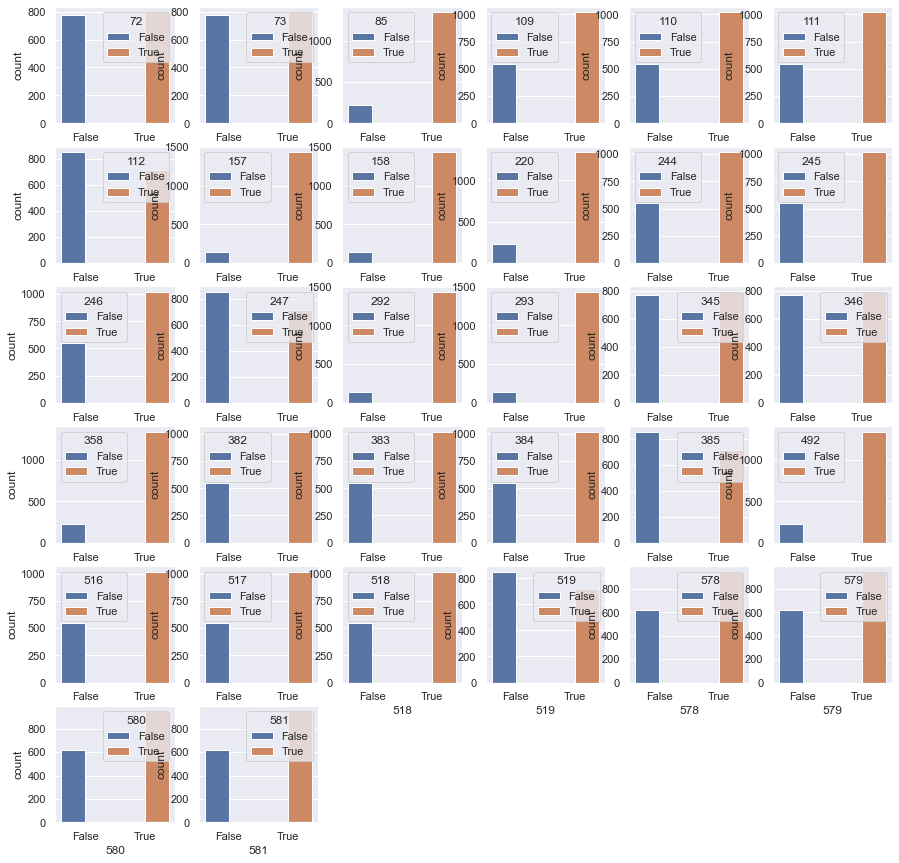

In [33]:
plt.figure(figsize=(15,15))
j = 1

for i in nan_cols: 
    plt.subplot(6,6,j)
    sns.countplot(df_nan[i],hue = df_nan[i])
    j+=1

###### Therefore we have alll the 32 features for which the number missing values are too many to be compensated by the number of present values. 

In [34]:
nan_cols = pd.DataFrame(nan_cols)

In [35]:
nan_cols

,0
0,72
1,73
2,85
3,109
4,110
5,111
6,112
7,157
8,158
9,220


for now let's not drop the missing values for they could hold some predictive value if included in the model post imputing. Therefore, for now we could hold the idea of dropping the columns. 

In [36]:
cols_2_remove

,0
0,13
1,52
2,97
3,141
4,149
...,...
109,536
110,537
111,538
112,49


In [37]:
nan_cols 

,0
0,72
1,73
2,85
3,109
4,110
5,111
6,112
7,157
8,158
9,220


for now let's not remove any columns and jump straight into the data cleansing phase for the reason that despite any apparent impotence of any number of columns only the model score can truly describe the necessity of of any column. 

# STEP 2 

###### outlier treatment

In [38]:
sig.isna().any().any()

False

In [39]:
feat_desc = sig.describe()
feat_desc

,0,1,2,3,4,5,6,7,8,9,...,580,581,582,583,584,585,586,587,588,589
count,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.0,1567.000000,1567.000000,1567.000000,1567.000000,...,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000
mean,3014.441551,2495.866110,2200.551958,1395.383474,4.171281,100.0,101.116476,0.121825,1.462860,-0.000842,...,0.004974,82.403069,0.500096,0.015317,0.003846,3.067628,0.021458,0.016474,0.005283,99.652345
std,73.480841,80.228143,29.380973,439.837330,56.103721,0.0,6.209385,0.008936,0.073849,0.015107,...,0.001985,56.348694,0.003403,0.017174,0.003719,3.576899,0.012354,0.008805,0.002866,93.864558
min,2743.240000,2158.750000,2060.660000,0.000000,0.681500,100.0,82.131100,0.000000,1.191000,-0.053400,...,0.001000,0.000000,0.477800,0.006000,0.001700,1.197500,-0.016900,0.003200,0.001000,0.000000
25%,2966.665000,2452.885000,2181.099950,1083.885800,1.017700,100.0,97.937800,0.121100,1.411250,-0.010800,...,0.004700,72.288900,0.497900,0.011600,0.003100,2.306500,0.013450,0.010600,0.003300,44.368600
50%,3011.490000,2499.405000,2201.066700,1285.214400,1.316800,100.0,101.512200,0.122400,1.461600,-0.001300,...,0.004700,72.288900,0.500200,0.013800,0.003600,2.757650,0.020500,0.014800,0.004600,71.900500
75%,3056.540000,2538.745000,2218.055500,1590.169900,1.518800,100.0,104.530000,0.123800,1.516850,0.008400,...,0.004700,72.288900,0.502350,0.016500,0.004100,3.294950,0.027600,0.020300,0.006400,114.749700
max,3356.350000,2846.440000,2315.266700,3715.041700,1114.536600,100.0,129.252200,0.128600,1.656400,0.074900,...,0.028600,737.304800,0.509800,0.476600,0.104500,99.303200,0.102800,0.079900,0.028600,737.304800


In [40]:
outlier_list = []
j=1
for i in list(feat_desc):
    print(j)
    j+=1
    q1 = feat_desc[i]['25%']
    q3 = feat_desc[i]['75%']
    iqr = np.abs(q1 - q3)
    up_lim = q3 + 1.5*iqr
    dwn_lim = q1 - 1.5*iqr
    mx = feat_desc[i]['max']
    mn = feat_desc[i]['min']
    if ((mn<=dwn_lim)|(mx>=up_lim)):
        print('OUTLIER PRESENCE CONFIRMED')
        outlier_list.append(i)
    else: 
        print('NO OUTLIERS')



1
OUTLIER PRESENCE CONFIRMED
2
OUTLIER PRESENCE CONFIRMED
3
OUTLIER PRESENCE CONFIRMED
4
OUTLIER PRESENCE CONFIRMED
5
OUTLIER PRESENCE CONFIRMED
6
OUTLIER PRESENCE CONFIRMED
7
OUTLIER PRESENCE CONFIRMED
8
OUTLIER PRESENCE CONFIRMED
9
OUTLIER PRESENCE CONFIRMED
10
OUTLIER PRESENCE CONFIRMED
11
OUTLIER PRESENCE CONFIRMED
12
OUTLIER PRESENCE CONFIRMED
13
OUTLIER PRESENCE CONFIRMED
14
OUTLIER PRESENCE CONFIRMED
15
OUTLIER PRESENCE CONFIRMED
16
OUTLIER PRESENCE CONFIRMED
17
OUTLIER PRESENCE CONFIRMED
18
OUTLIER PRESENCE CONFIRMED
19
OUTLIER PRESENCE CONFIRMED
20
OUTLIER PRESENCE CONFIRMED
21
OUTLIER PRESENCE CONFIRMED
22
OUTLIER PRESENCE CONFIRMED
23
OUTLIER PRESENCE CONFIRMED
24
OUTLIER PRESENCE CONFIRMED
25
OUTLIER PRESENCE CONFIRMED
26
OUTLIER PRESENCE CONFIRMED
27
OUTLIER PRESENCE CONFIRMED
28
OUTLIER PRESENCE CONFIRMED
29
OUTLIER PRESENCE CONFIRMED
30
OUTLIER PRESENCE CONFIRMED
31
OUTLIER PRESENCE CONFIRMED
32
OUTLIER PRESENCE CONFIRMED
33
OUTLIER PRESENCE CONFIRMED
34
OUTLIER PRESENCE

419
NO OUTLIERS
420
NO OUTLIERS
421
OUTLIER PRESENCE CONFIRMED
422
OUTLIER PRESENCE CONFIRMED
423
OUTLIER PRESENCE CONFIRMED
424
OUTLIER PRESENCE CONFIRMED
425
OUTLIER PRESENCE CONFIRMED
426
OUTLIER PRESENCE CONFIRMED
427
OUTLIER PRESENCE CONFIRMED
428
OUTLIER PRESENCE CONFIRMED
429
OUTLIER PRESENCE CONFIRMED
430
OUTLIER PRESENCE CONFIRMED
431
OUTLIER PRESENCE CONFIRMED
432
OUTLIER PRESENCE CONFIRMED
433
OUTLIER PRESENCE CONFIRMED
434
OUTLIER PRESENCE CONFIRMED
435
OUTLIER PRESENCE CONFIRMED
436
OUTLIER PRESENCE CONFIRMED
437
OUTLIER PRESENCE CONFIRMED
438
OUTLIER PRESENCE CONFIRMED
439
OUTLIER PRESENCE CONFIRMED
440
OUTLIER PRESENCE CONFIRMED
441
OUTLIER PRESENCE CONFIRMED
442
NO OUTLIERS
443
OUTLIER PRESENCE CONFIRMED
444
OUTLIER PRESENCE CONFIRMED
445
OUTLIER PRESENCE CONFIRMED
446
OUTLIER PRESENCE CONFIRMED
447
OUTLIER PRESENCE CONFIRMED
448
OUTLIER PRESENCE CONFIRMED
449
OUTLIER PRESENCE CONFIRMED
450
OUTLIER PRESENCE CONFIRMED
451
OUTLIER PRESENCE CONFIRMED
452
OUTLIER PRESENCE C

###### There seems to be some presence of outliers in almost every feature except for the ones below. 

In [41]:
for i in list(range(0,590)):
    if i not in outlier_list:
        print(i)
    

47
51
132
136
267
268
304
405
409
418
419
441
482
486
488
499
500
511
539
542


In [42]:
outlier_list

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 48,
 49,
 50,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 133,
 134,
 135,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188

In [43]:
feat_desc[outlier_list]

,0,1,2,3,4,5,6,7,8,9,...,580,581,582,583,584,585,586,587,588,589
count,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.0,1567.000000,1567.000000,1567.000000,1567.000000,...,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000
mean,3014.441551,2495.866110,2200.551958,1395.383474,4.171281,100.0,101.116476,0.121825,1.462860,-0.000842,...,0.004974,82.403069,0.500096,0.015317,0.003846,3.067628,0.021458,0.016474,0.005283,99.652345
std,73.480841,80.228143,29.380973,439.837330,56.103721,0.0,6.209385,0.008936,0.073849,0.015107,...,0.001985,56.348694,0.003403,0.017174,0.003719,3.576899,0.012354,0.008805,0.002866,93.864558
min,2743.240000,2158.750000,2060.660000,0.000000,0.681500,100.0,82.131100,0.000000,1.191000,-0.053400,...,0.001000,0.000000,0.477800,0.006000,0.001700,1.197500,-0.016900,0.003200,0.001000,0.000000
25%,2966.665000,2452.885000,2181.099950,1083.885800,1.017700,100.0,97.937800,0.121100,1.411250,-0.010800,...,0.004700,72.288900,0.497900,0.011600,0.003100,2.306500,0.013450,0.010600,0.003300,44.368600
50%,3011.490000,2499.405000,2201.066700,1285.214400,1.316800,100.0,101.512200,0.122400,1.461600,-0.001300,...,0.004700,72.288900,0.500200,0.013800,0.003600,2.757650,0.020500,0.014800,0.004600,71.900500
75%,3056.540000,2538.745000,2218.055500,1590.169900,1.518800,100.0,104.530000,0.123800,1.516850,0.008400,...,0.004700,72.288900,0.502350,0.016500,0.004100,3.294950,0.027600,0.020300,0.006400,114.749700
max,3356.350000,2846.440000,2315.266700,3715.041700,1114.536600,100.0,129.252200,0.128600,1.656400,0.074900,...,0.028600,737.304800,0.509800,0.476600,0.104500,99.303200,0.102800,0.079900,0.028600,737.304800


In [44]:
def remove_outliers():
    for i in list(outlier_list):
            q1 = feat_desc[i]['25%']
            q3 = feat_desc[i]['75%']
            iqr = np.abs(q1 - q3)
            up_lim = q3 + 1.5*iqr
            dwn_lim = q1 - 1.5*iqr
            mx = feat_desc[i]['max']
            mn = feat_desc[i]['min']
            sig[i] = sig[i][~((sig[i]<dwn_lim)|(sig[i]>up_lim))]
            print(f'removed outliers for {i}!')
            print('')
            print('')
     

In [45]:
remove_outliers()

removed outliers for 0!


removed outliers for 1!


removed outliers for 2!


removed outliers for 3!


removed outliers for 4!


removed outliers for 5!


removed outliers for 6!


removed outliers for 7!


removed outliers for 8!


removed outliers for 9!


removed outliers for 10!


removed outliers for 11!


removed outliers for 12!


removed outliers for 13!


removed outliers for 14!


removed outliers for 15!


removed outliers for 16!


removed outliers for 17!


removed outliers for 18!


removed outliers for 19!


removed outliers for 20!


removed outliers for 21!


removed outliers for 22!


removed outliers for 23!


removed outliers for 24!


removed outliers for 25!


removed outliers for 26!


removed outliers for 27!


removed outliers for 28!


removed outliers for 29!


removed outliers for 30!


removed outliers for 31!


removed outliers for 32!


removed outliers for 33!


removed outliers for 34!


removed outliers for 35!


removed outliers for 36!


removed out

removed outliers for 320!


removed outliers for 321!


removed outliers for 322!


removed outliers for 323!


removed outliers for 324!


removed outliers for 325!


removed outliers for 326!


removed outliers for 327!


removed outliers for 328!


removed outliers for 329!


removed outliers for 330!


removed outliers for 331!


removed outliers for 332!


removed outliers for 333!


removed outliers for 334!


removed outliers for 335!


removed outliers for 336!


removed outliers for 337!


removed outliers for 338!


removed outliers for 339!


removed outliers for 340!


removed outliers for 341!


removed outliers for 342!


removed outliers for 343!


removed outliers for 344!


removed outliers for 345!


removed outliers for 346!


removed outliers for 347!


removed outliers for 348!


removed outliers for 349!


removed outliers for 350!


removed outliers for 351!


removed outliers for 352!


removed outliers for 353!


removed outliers for 354!


removed outliers for

Therefore 1 cycle of removing outliers has been done. 

###### missing value treatment

In [46]:
sig.isna().any().any()

True

In [47]:
from sklearn.impute import SimpleImputer
rep_nan = SimpleImputer(missing_values=np.nan, strategy="median")
cols=sig.columns
sig = pd.DataFrame(rep_nan.fit_transform(sig))

In [48]:
sig.isna().any().any()

False

Missing values have also been treated. 

# STEP 4

###### Treating target imbalance

In [49]:
target = signal['Pass/Fail']

###### Checking for target attributes imbalance

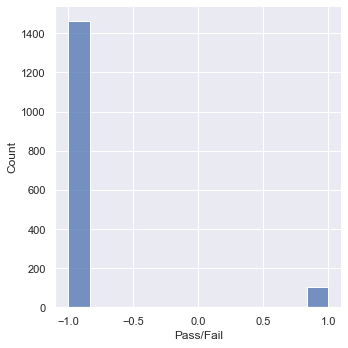

In [50]:
sns.displot(target)

In [51]:
signal.shape

(1567, 592)

In [52]:
target.shape

(1567,)

In [53]:
from imblearn.over_sampling import SMOTE

In [54]:
 print("Before UpSampling, counts of label '-1': {}".format(sum(target==-1)))
print("Before UpSampling, counts of label '1': {} \n".format(sum(target==1)))

sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=1)   #Synthetic Minority Over Sampling Technique
sig, target = sm.fit_sample(sig, target.ravel())

Before UpSampling, counts of label '-1': 1463
Before UpSampling, counts of label '1': 104 



In [55]:
print("After UpSampling, counts of label '-1': {}".format(sum(target==-1)))
print("After UpSampling, counts of label '1': {} \n".format(sum(target==1)))

After UpSampling, counts of label '-1': 1463
After UpSampling, counts of label '1': 1463 



In [56]:
print('After UpSampling, the shape of independant features: {}'.format(sig.shape))
print('After UpSampling, the shape of dependant feature: {} \n'.format(target.shape))

After UpSampling, the shape of independant features: (2926, 590)
After UpSampling, the shape of dependant feature: (2926,) 



C:\Users\Vishak\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

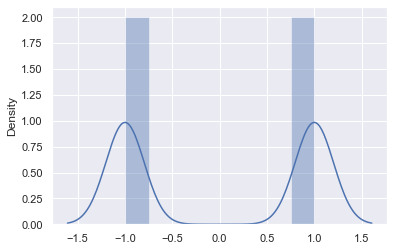

In [57]:
sns.distplot(target)

Therefore it's clear that target attribute imbalance has been treated. 

###### Train-Test Splitting

In [58]:
from sklearn.model_selection import train_test_split

In [59]:
x_train, x_test, y_train, y_test = train_test_split(sig, target, test_size = 0.30, random_state = 1)

In [60]:
x_train.shape[0]

2048

In [61]:
print(f'percentages of input feature train and test sets : {round((x_train.shape[0]/sig.shape[0])*100,2)}, {round((x_test.shape[0]/sig.shape[0])*100,2)}')


percentages of input feature train and test sets : 69.99, 30.01


In [62]:
print(f'percentages of target train and test sets : {round((len(y_train)/len(target))*100,2)}, {round((len(y_test)/len(target))*100,2)}')


percentages of target train and test sets : 69.99, 30.01


In [63]:
x_feat = x_train.describe()
x_feat

,0,1,2,3,4,5,6,7,8,9,...,580,581,582,583,584,585,586,587,588,589
count,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000,2048.0,2048.000000,2048.000000,2048.000000,2048.000000,...,2.048000e+03,2.048000e+03,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000
mean,3002.217268,2495.326531,2199.261045,1334.086799,1.286377,100.0,101.508995,0.122359,1.465724,-0.002363,...,4.700000e-03,7.228890e+01,0.500416,0.013843,0.003584,2.765693,0.020716,0.015970,0.005129,77.941818
std,59.743171,55.001019,23.188678,289.668797,0.296362,0.0,3.954134,0.001659,0.062260,0.012771,...,1.474875e-16,1.236646e-12,0.003202,0.002857,0.000644,0.571138,0.009450,0.005930,0.001984,43.183993
min,2831.910000,2327.290000,2126.655500,711.025800,0.681500,100.0,88.091100,0.117100,1.253200,-0.039300,...,4.700000e-03,7.228890e+01,0.491500,0.006000,0.001800,1.197500,-0.006000,0.003200,0.001000,0.000000
25%,2960.698065,2461.846728,2182.882339,1108.765350,1.068952,100.0,99.267800,0.121200,1.424252,-0.009945,...,4.700000e-03,7.228890e+01,0.498400,0.011700,0.003100,2.336485,0.014181,0.011502,0.003700,48.497175
50%,3000.041656,2499.570000,2198.948580,1283.403450,1.301193,100.0,101.611100,0.122212,1.465605,-0.002210,...,4.700000e-03,7.228890e+01,0.500522,0.013600,0.003500,2.713700,0.020593,0.015216,0.004800,67.508850
75%,3039.962500,2528.512500,2214.197250,1517.015200,1.459922,100.0,103.936700,0.123500,1.506725,0.005205,...,4.700000e-03,7.228890e+01,0.502500,0.015642,0.004000,3.118574,0.026784,0.019739,0.006215,94.083983
max,3190.970000,2666.040000,2270.255600,2347.909200,2.244900,100.0,113.883300,0.127600,1.653900,0.035400,...,4.700000e-03,7.228890e+01,0.509000,0.023700,0.005600,4.736600,0.048400,0.034500,0.010800,220.037800


In [64]:
x_feat = x_feat.transpose()
x_feat

,count,mean,std,min,25%,50%,75%,max
0,2048.0,3002.217268,59.743171,2831.9100,2960.698065,3000.041656,3039.962500,3190.9700
1,2048.0,2495.326531,55.001019,2327.2900,2461.846728,2499.570000,2528.512500,2666.0400
2,2048.0,2199.261045,23.188678,2126.6555,2182.882339,2198.948580,2214.197250,2270.2556
3,2048.0,1334.086799,289.668797,711.0258,1108.765350,1283.403450,1517.015200,2347.9092
4,2048.0,1.286377,0.296362,0.6815,1.068952,1.301193,1.459922,2.2449
...,...,...,...,...,...,...,...,...
585,2048.0,2.765693,0.571138,1.1975,2.336485,2.713700,3.118574,4.7366
586,2048.0,0.020716,0.009450,-0.0060,0.014181,0.020593,0.026784,0.0484
587,2048.0,0.015970,0.005930,0.0032,0.011502,0.015216,0.019739,0.0345
588,2048.0,0.005129,0.001984,0.0010,0.003700,0.004800,0.006215,0.0108


In [65]:
train_mean = x_feat['mean'].sum()/len(x_feat['mean'])

In [66]:
x_feat = x_test.describe().transpose()

In [67]:
test_mean = x_feat['mean'].sum()/len(x_feat['mean'])

In [68]:
train_mean - test_mean

-0.046387528884920926

In [69]:
x_feat = x_train.describe().transpose()
train_std = x_feat['std'].sum()/len(x_feat['std'])

x_feat = x_test.describe().transpose()
test_std = x_feat['std'].sum()/len(x_feat['std'])

train_std - test_std

0.11609247776350529

There doesn't seem to be much differences in the means and the standard deviations of the train and test sets. 

In [70]:
from scipy.stats import zscore

In [71]:
from sklearn.preprocessing import StandardScaler

In [72]:
cols = x_train.columns 

scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_train.shape

(2048, 590)

In [73]:
x_train = pd.DataFrame(x_train, columns = cols)

In [74]:
x_train.head()

,0,1,2,3,4,5,6,7,8,9,...,580,581,582,583,584,585,586,587,588,589
0,1.058668,0.077171,0.034748,-1.109856,0.367962,0.0,0.393458,-0.699006,-0.217265,-0.590294,...,0.0,0.0,-0.692247,1.945757,1.111272,1.959560,0.474625,-0.045545,-0.266747,-0.360261
1,-0.188641,-2.098047,0.833229,1.029657,-1.507904,0.0,-0.854478,-0.759291,-0.998050,0.459218,...,0.0,0.0,-2.222936,0.965429,0.490209,1.035215,-2.319609,-0.146742,-0.569221,-1.805318
2,-0.564497,-1.956224,-0.159282,-0.614299,-0.160143,0.0,0.435545,-0.495187,-0.154942,-0.174526,...,0.0,0.0,0.225245,-0.450229,0.532107,-0.465802,-0.140435,-0.707876,-0.479332,-0.396729
3,-0.706565,0.075818,1.218142,0.330839,-0.575908,0.0,-0.142305,-1.154103,0.190716,1.761192,...,0.0,0.0,0.353895,1.466561,0.474976,1.461107,-1.007585,-1.290678,-1.189006,-0.093980
4,-1.859198,-0.276727,-1.182135,-1.357382,0.014255,0.0,0.496894,0.627270,1.087255,0.952645,...,0.0,0.0,-0.083095,-0.084922,-0.130855,-0.091057,0.474625,-0.045545,-0.266747,-0.360261


In [75]:
scaler_1 = StandardScaler()
x_test = scaler_1.fit_transform(x_test)
x_test = pd.DataFrame(x_test, columns = cols)
x_test.head()

,0,1,2,3,4,5,6,7,8,9,...,580,581,582,583,584,585,586,587,588,589
0,-0.291446,1.770468,0.314859,1.778047,2.628179,0.0,-1.375574,1.314531,0.173284,-0.316886,...,-1.0,0.0,0.886903,0.762048,0.498556,0.736965,-0.583046,-0.573276,-0.630613,0.027416
1,-0.751992,-1.110755,-2.520989,-0.732353,0.292603,0.0,0.225150,1.789431,-1.374551,-1.024698,...,-1.0,0.0,-1.739054,0.383748,0.038841,0.454253,-1.022780,0.527012,0.351578,2.031576
2,0.692919,-0.609222,0.447785,1.008403,0.057225,0.0,-0.877009,-0.316977,-1.406652,1.063629,...,-1.0,0.0,0.122926,2.101060,2.332440,2.100147,2.241977,-0.082918,0.274564,-0.911694
3,-1.500808,-0.927904,-1.365260,-1.452753,-0.739270,0.0,0.801539,-0.169534,1.017558,-2.070687,...,-1.0,0.0,0.449243,-0.751152,-1.187064,-0.773803,-0.761033,-0.055493,-0.139517,0.767581
4,1.294430,0.410440,0.476001,0.660857,1.909271,0.0,-1.026120,-0.109215,-0.147929,0.603798,...,-1.0,0.0,0.303455,0.304503,0.674744,0.299789,1.050369,-1.448859,-1.263266,-1.229780


# STEP 5: MODEL TRAINING

###### Ensemble Techniques

###### Logistic Regression:

In [76]:
def fit_n_print(model,x_train,x_test,y_train,y_test):
    from sklearn import metrics 
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    score = round(model.score(x_test,y_test),3)
    
    tn,fp,fn,tp = metrics.confusion_matrix(y_test,pred).ravel()
    
    recall = round(tp/(tp+fn),3)
    precision = round(tp/(tp+fp),3)
    specificity = round(tn/(tn+fp),3)
    f1_score = round(2*precision*recall/(precision+recall),3)
    
    return score,recall,precision,specificity,f1_score
    

In [77]:
lr = LogisticRegression(solver = 'liblinear')
lr_accuracy, lr_recall, lr_precision, lr_specificity, lr_f1_score = fit_n_print(lr,x_train,x_test,y_train,y_test)

In [78]:
lr_result = pd.DataFrame({'Model':['lr_original'],
                       'Accuracy':[lr_accuracy],
                       'Recall':[lr_recall],
                       'Precision':[lr_precision],
                       'Specificity':[lr_specificity],
                       'F1_score':[lr_f1_score]})

In [79]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929,1.0,0.875,0.86,0.933


we're getting a perfect recall score. But we shall see if the precision and f1_score can be further improved. Also precision is the most important measure of correctness since it would be a costly mistake to wrongly approve a defective a piece. 

###### Bagging

In [80]:
def bag_n_print(model,x_train,x_test,y_train,y_test):
    from sklearn import metrics
    model.fit(x_train,y_train)
    bgcl = BaggingClassifier(base_estimator=model, n_estimators=50, random_state=1)
    bgcl.fit(x_train,y_train)
    pred = bgcl.predict(x_test)
    score = bgcl.score(x_test,y_test)
    
    tn, fp, fn, tp = metrics.confusion_matrix(y_test, pred).ravel()
    
    recall = round(tp/(tp+fn),3)
    precision = round(tp/(tp+fp),3)
    specificity = round(tn/(tn+fp),3)
    f1_score = round(2*precision*recall/(precision + recall),3)
    
    return score, recall, precision, specificity, f1_score 

In [81]:
lr_accuracy, lr_recall, lr_precision, lr_specificity, lr_f1_score = bag_n_print(lr,x_train,x_test,y_train,y_test)

In [82]:
temp_result = pd.DataFrame({'Model':['lr_bag'],
                       'Accuracy':[lr_accuracy],
                       'Recall':[lr_recall],
                       'Precision':[lr_precision],
                       'Specificity':[lr_specificity],
                       'F1_score':[lr_f1_score]})

In [83]:
# temp = pd.concat(lr_result,temp_result)
# temp

lr_result = pd.concat([lr_result,temp_result],axis = 0)

In [84]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.0,0.875,0.860,0.933
0,lr_bag,0.928246,1.0,0.873,0.858,0.932


Post bagging, there's a slight decline in the precision and f1 score. We shall check try other ensemble techniques for improved results. 

###### Boosting

In [85]:
def boost_n_print(model,x_train,x_test,y_train,y_test):
    from sklearn import metrics
    model.fit(x_train,y_train)
    abcl = AdaBoostClassifier(base_estimator = model,n_estimators=50,random_state=1,algorithm='SAMME')
    
    #[Discrete SAMME AdaBoost adapts based on errors in predicted class labels whereas real SAMME.R uses
    #the predicted class probabilities.]
    
    abcl = abcl.fit(x_train,y_train)
    pred = abcl.predict(x_test)
    score = abcl.score(x_test,y_test)
    
    tn,fp,fn,tp = metrics.confusion_matrix(y_test,pred).ravel()
    
    recall = round(tp/(tp+fn),3)
    precision = round(tp/(tp+fp),3)
    specificity = round(tn/(tn+fp),3)
    f1_score = round(2*recall*precision/(recall+precision),3)
    
    return score,recall,precision,specificity,f1_score

In [86]:
lr_accuracy, lr_recall, lr_precision, lr_specificity, lr_f1_score = boost_n_print(lr,x_train,x_test,y_train,y_test)

temp_result = pd.DataFrame({'Model':['lr_boost'],
                       'Accuracy':[lr_accuracy],
                       'Recall':[lr_recall],
                       'Precision':[lr_precision],
                       'Specificity':[lr_specificity],
                       'F1_score':[lr_f1_score]})

In [87]:
lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925


Post boosting, there's a slight decline in the precision and f1 score. We shall check try other ensemble techniques for improved results. 

###### Ridge regularization. 

In [88]:
ridge = Ridge(alpha=.3)
ridge.fit(x_train,y_train)

Ridge(alpha=0.3)

In [89]:
from sklearn import metrics
pred = ridge.predict(x_test)
score = round(ridge.score(x_test,y_test),3)

In [90]:
score

0.562

Ridge regularization doesn't seem to be much of a benefit. 

###### K Nearest Neighbors

In [91]:
knn = KNeighborsClassifier()
knn_accuracy, knn_recall, knn_precision, knn_specificity, knn_f1_score = fit_n_print(knn,x_train,x_test,y_train,y_test)

In [92]:
temp_result = pd.DataFrame({'Model':['knn_original'],
                       'Accuracy':[knn_accuracy],
                       'Recall':[knn_recall],
                       'Precision':[knn_precision],
                       'Specificity':[knn_specificity],
                       'F1_score':[knn_f1_score]})

In [93]:
lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678


KNN seems to be a very easy contender against logistic regression from the precision and accuracy. 

###### Bagging

In [94]:
knn_accuracy, knn_recall, knn_precision, knn_specificity, knn_f1_score = bag_n_print(knn,x_train,x_test,y_train,y_test)

In [95]:
temp_result = pd.DataFrame({'Model':['knn_bag'],
                       'Accuracy':[knn_accuracy],
                       'Recall':[knn_recall],
                       'Precision':[knn_precision],
                       'Specificity':[knn_specificity],
                       'F1_score':[knn_f1_score]})

lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675


Bagging again causes a slight decline in the precision and f1 score. 

###### Boosting

In [96]:
# boosting does not apply to knn, therefore boosting will be skipped for this model. 

In [97]:
# temp_result = pd.DataFrame({'Model':['knn_boost'],
#                        'Accuracy':[knn_accuracy],
#                        'Recall':[knn_recall],
#                        'Precision':[knn_precision],
#                        'Specificity':[knn_specificity],
#                        'F1_score':[knn_f1_score]})

# lr_result = pd.concat([lr_result,temp_result],axis = 0)
# lr_result

###### Support Vector Machine

In [98]:
svm = SVC(gamma='auto', kernel = 'poly', degree = 2)
svm_accuracy, svm_recall, svm_precision, svm_specificity, svm_f1_score = fit_n_print(svm,x_train,x_test,y_train,y_test)

In [99]:
temp_result = pd.DataFrame({'Model':['svm_original'],
                       'Accuracy':[svm_accuracy],
                       'Recall':[svm_recall],
                       'Precision':[svm_precision],
                       'Specificity':[svm_specificity],
                       'F1_score':[svm_f1_score]})

lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990


Support Vector Excpetionally beats Logistics Regression and knn both on their original and ensembled versions in almost all the scores. We shall observe if the precision and f1 can be improved. 

###### Bagging

In [100]:
svm_accuracy, svm_recall, svm_precision, svm_specificity, svm_f1_score = bag_n_print(svm,x_train,x_test,y_train,y_test)

In [101]:
temp_result = pd.DataFrame({'Model':['svm_bag'],
                       'Accuracy':[svm_accuracy],
                       'Recall':[svm_recall],
                       'Precision':[svm_precision],
                       'Specificity':[svm_specificity],
                       'F1_score':[svm_f1_score]})

lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987


Post bagging, a slight decline can be observed in the test in the precision and f1 score. 

###### Boosting

In [102]:
svm_accuracy, svm_recall, svm_precision, svm_specificity, svm_f1_score = boost_n_print(svm,x_train,x_test,y_train,y_test)

In [103]:
temp_result = pd.DataFrame({'Model':['svm_boost'],
                       'Accuracy':[svm_accuracy],
                       'Recall':[svm_recall],
                       'Precision':[svm_precision],
                       'Specificity':[svm_specificity],
                       'F1_score':[svm_f1_score]})

lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661


Post boosting, a major decline can be observed in the test in the precision and f1 score which withdraws much of any hope on boosted SVMs. 

###### Naive Bayes

In [104]:
nb = GaussianNB()
nb_accuracy, nb_recall, nb_precision, nb_specificity, nb_f1_score = fit_n_print(nb,x_train,x_test,y_train,y_test)

In [105]:
temp_result = pd.DataFrame({'Model':['nb_original'],
                       'Accuracy':[nb_accuracy],
                       'Recall':[nb_recall],
                       'Precision':[nb_precision],
                       'Specificity':[nb_specificity],
                       'F1_score':[nb_f1_score]})

lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883


Naive Bayes proves a good contender but still doesn't svm in the precision and f1 scores. We shall observe the performance of boosted and bagged Naive Bayes models further ahead. 

###### Bagging

In [106]:
nb_accuracy, nb_recall, nb_precision, nb_specificity, nb_f1_score = bag_n_print(nb,x_train,x_test,y_train,y_test)

In [107]:
temp_result = pd.DataFrame({'Model':['nb_bag'],
                       'Accuracy':[nb_accuracy],
                       'Recall':[nb_recall],
                       'Precision':[nb_precision],
                       'Specificity':[nb_specificity],
                       'F1_score':[nb_f1_score]})

lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


Bagging seems to have a slight positive effect on Naive Bayes but we shall check if Boosting can do better. 

###### Boosting

In [108]:
nb_accuracy, nb_recall, nb_precision, nb_specificity, nb_f1_score = boost_n_print(nb,x_train,x_test,y_train,y_test)

In [109]:
temp_result = pd.DataFrame({'Model':['nb_boost'],
                       'Accuracy':[nb_accuracy],
                       'Recall':[nb_recall],
                       'Precision':[nb_precision],
                       'Specificity':[nb_specificity],
                       'F1_score':[nb_f1_score]})

lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


Probably boosting does not favour the model yet. 

###### Decision Trees

In [110]:
dTree = DecisionTreeClassifier(criterion = 'gini', random_state = 1)
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = fit_n_print(dTree,x_train,x_test,y_train,y_test)

In [111]:
temp_result = pd.DataFrame({'Model':['dt_original'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


Decision Tree currently delivers a very mediocre/average set of scores, but we shall observe its performance post boosting and bagging. 

###### Bagging 

In [112]:
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = bag_n_print(dTree,x_train,x_test,y_train,y_test)

In [113]:
temp_result = pd.DataFrame({'Model':['dt_bag'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


Post Bagging, scores are still mediocre and even lesser than the unbagged model. 

###### Boosting

In [114]:
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = boost_n_print(dTree,x_train,x_test,y_train,y_test)

In [115]:
temp_result = pd.DataFrame({'Model':['dt_boost'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


Boosting fails to impress against svm as well. 

###### Principle Component Analysis

In [116]:
scaler = StandardScaler()
# x_train = scaler.fit_transform(x_train)
# x_train.shape

sig_scaled = scaler.fit_transform(sig)
sig_scaled = pd.DataFrame(sig_scaled)

In [117]:
sig_scaled

,0,1,2,3,4,5,6,7,8,9,...,580,581,582,583,584,585,586,587,588,589
0,0.491959,1.233164,-0.487667,0.253725,0.252348,0.0,-0.975706,1.099647,0.537239,1.446321,...,-1.0,0.0,0.031219,-0.705124,-0.125866,-0.695839,-0.030767,-0.188469,-0.257849,-0.143192
1,1.584571,-0.560312,1.344076,0.433113,-1.540059,0.0,0.222159,1.399659,0.474703,0.136862,...,-1.0,0.0,0.468642,2.951018,2.967043,2.926228,-1.180578,0.694012,0.442261,2.969984
2,-1.164566,1.159509,-0.544402,1.233368,0.758868,0.0,-1.513986,1.039644,-0.375151,0.497551,...,-1.0,0.0,-1.437273,0.652872,0.492716,0.716135,-0.062414,-0.271722,-0.307857,0.107127
3,-0.219208,-0.292542,-0.002794,-1.458176,0.117951,0.0,0.701660,-0.400412,0.340009,-0.796227,...,-1.0,0.0,-0.437449,-1.227430,-1.672320,-1.232790,-0.062414,-0.171819,-0.357865,-0.098821
4,0.514030,0.124170,1.470422,-0.035180,0.837210,0.0,-0.270814,0.679630,0.578930,-0.067006,...,-1.0,0.0,-0.078137,-0.078357,-0.125866,-0.085637,-0.062414,-0.171819,-0.357865,-0.098821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2921,-0.743697,0.373861,-0.159580,-1.250272,-1.436782,0.0,-0.133860,-1.033203,0.630273,-0.095553,...,-1.0,0.0,-1.261624,-0.219038,-0.651952,-0.182745,1.377574,0.434412,0.249914,-0.419100
2922,-0.408268,-0.001057,0.230381,-1.081267,-0.254134,0.0,0.161159,0.359549,0.776108,-0.483571,...,-1.0,0.0,-0.813999,0.473847,-0.125866,0.505320,-1.739515,-0.390860,-0.298546,-1.605605
2923,-0.145862,0.033488,-1.219457,-0.849059,-0.749109,0.0,0.661944,1.418141,0.613378,0.199204,...,-1.0,0.0,-1.542022,0.090616,0.504452,0.127873,-0.785847,-0.304874,-0.046433,0.818772
2924,0.638689,0.361228,-0.118502,0.243304,1.496815,0.0,-1.113290,0.069171,-0.089342,-0.251778,...,-1.0,0.0,0.066537,0.079102,0.099389,0.080230,1.041995,0.044252,-0.982970,-0.484617


In [118]:
pca = PCA(n_components=590)
pca.fit(sig_scaled)

PCA(n_components=590)

In [119]:
print(pca.explained_variance_)

[1.91078243e+01 1.45337112e+01 1.21543204e+01 1.04301835e+01
 9.75958228e+00 8.80081715e+00 7.96576204e+00 7.74724270e+00
 7.44490944e+00 7.02127877e+00 6.61200690e+00 6.29726303e+00
 6.15142120e+00 5.88009317e+00 5.69130180e+00 5.45029944e+00
 5.31857141e+00 5.20569267e+00 5.08943518e+00 5.00182188e+00
 4.76574632e+00 4.64213313e+00 4.35173414e+00 4.27763080e+00
 4.23468593e+00 4.18072031e+00 4.02984135e+00 3.97474759e+00
 3.91400841e+00 3.83024434e+00 3.80222434e+00 3.74577747e+00
 3.57554026e+00 3.56070421e+00 3.46712247e+00 3.43758617e+00
 3.29080200e+00 3.27967865e+00 3.22712826e+00 3.14369539e+00
 3.11219179e+00 3.01773744e+00 2.97237821e+00 2.89824448e+00
 2.87918766e+00 2.79929289e+00 2.76464764e+00 2.71708066e+00
 2.70755205e+00 2.65021240e+00 2.61458304e+00 2.55170542e+00
 2.50734176e+00 2.48523180e+00 2.42787753e+00 2.42143970e+00
 2.33090151e+00 2.28330447e+00 2.26864934e+00 2.21763167e+00
 2.16693838e+00 2.15620970e+00 2.14208117e+00 2.07712692e+00
 2.04662394e+00 2.018031

The eigen Vectors

In [120]:
print(pca.components_)

[[-3.99758372e-02 -9.07045067e-03  1.79654444e-02 ...  2.06035677e-02
   2.38514259e-02  2.83796518e-02]
 [-2.85635655e-03 -1.91772443e-03  4.41841708e-02 ... -9.12119760e-03
  -1.09878707e-02  3.82980215e-02]
 [-8.94466587e-03 -3.87864382e-03  1.59254406e-02 ...  3.00894168e-02
   4.19151310e-02  3.00479760e-02]
 ...
 [ 0.00000000e+00  1.08111085e-48 -1.18758640e-47 ...  1.71056941e-49
   4.53300895e-48  4.66130165e-48]
 [ 0.00000000e+00 -7.76495591e-48  2.90309833e-48 ...  5.98699295e-49
   3.59219577e-48 -4.23365930e-48]
 [ 0.00000000e+00  1.81617331e-47 -1.76430484e-47 ...  2.96569972e-47
  -9.70748143e-48 -1.47964254e-47]]


And the percentage of variation explained by each eigen Vector

In [121]:
print(pca.explained_variance_ratio_)

[4.38103072e-02 3.33228076e-02 2.78673544e-02 2.39142635e-02
 2.23767129e-02 2.01784618e-02 1.82638524e-02 1.77628325e-02
 1.70696446e-02 1.60983467e-02 1.51599705e-02 1.44383276e-02
 1.41039423e-02 1.34818430e-02 1.30489833e-02 1.24964145e-02
 1.21943893e-02 1.19355816e-02 1.16690271e-02 1.14681478e-02
 1.09268751e-02 1.06434555e-02 9.97763044e-03 9.80772675e-03
 9.70926301e-03 9.58553094e-03 9.23959655e-03 9.11327790e-03
 8.97401547e-03 8.78196171e-03 8.71771762e-03 8.58829655e-03
 8.19797769e-03 8.16396169e-03 7.94939802e-03 7.88167736e-03
 7.54513147e-03 7.51962792e-03 7.39914071e-03 7.20784630e-03
 7.13561504e-03 6.91905065e-03 6.81505129e-03 6.64507791e-03
 6.60138455e-03 6.41820228e-03 6.33876785e-03 6.22970656e-03
 6.20785942e-03 6.07639140e-03 5.99470062e-03 5.85053519e-03
 5.74881845e-03 5.69812487e-03 5.56662333e-03 5.55186271e-03
 5.34427727e-03 5.23514707e-03 5.20154587e-03 5.08457284e-03
 4.96834359e-03 4.94374493e-03 4.91135112e-03 4.76242438e-03
 4.69248735e-03 4.626931

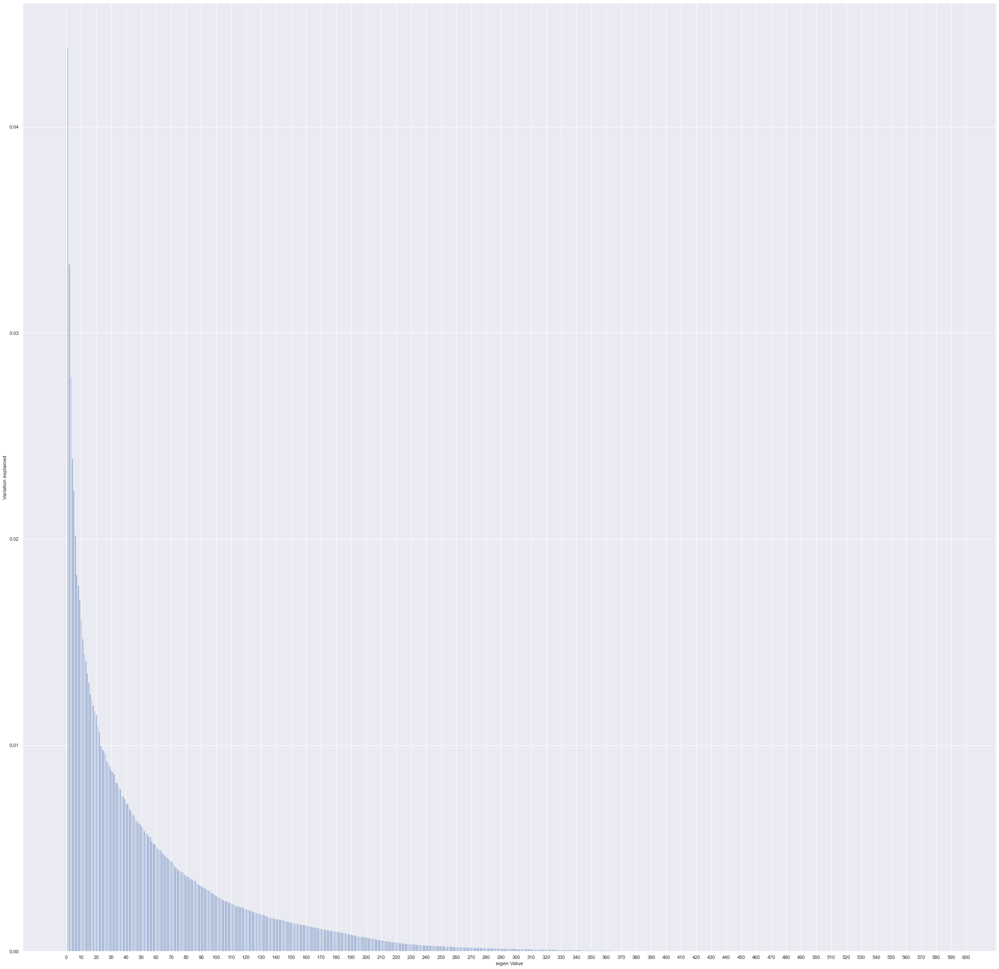

In [122]:
plt.figure(figsize = (40,40))
plt.bar(list(range(1,591)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.xticks(np.arange(0, 600+1, 10))
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

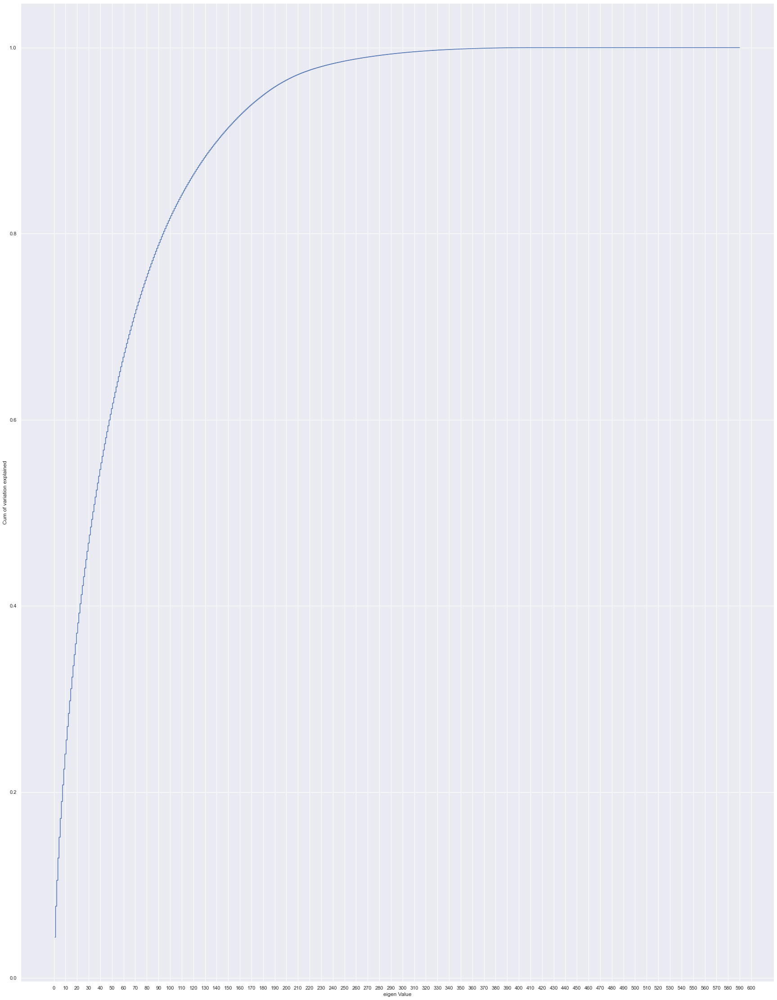

In [123]:
plt.figure(figsize = (30,40))
plt.step(list(range(1,591)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.xticks(np.arange(0, 600+1, 10))
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

From the above variation ratio plot maybe, it is fair to deduce that probably 150 features can summarise the entire variation in the data. 

In [124]:
pca1 = PCA(n_components=180)
pca1.fit(sig_scaled)
print(pca1.components_)
print(pca1.explained_variance_ratio_)
x_pca = pca1.transform(sig_scaled)



[[-0.03997584 -0.00907045  0.01796544 ...  0.02060357  0.02385143
   0.02837965]
 [-0.00285636 -0.00191772  0.04418417 ... -0.0091212  -0.01098787
   0.03829802]
 [-0.00894467 -0.00387864  0.01592544 ...  0.03008942  0.04191513
   0.03004798]
 ...
 [ 0.1850981  -0.07102606  0.07163026 ...  0.03764826  0.03938221
  -0.08601579]
 [ 0.00645205  0.064759    0.00544161 ... -0.00453036  0.01420869
  -0.0655008 ]
 [-0.10274576 -0.11730591  0.00654103 ... -0.02359683  0.00525839
   0.00372613]]
[0.04381031 0.03332281 0.02786735 0.02391426 0.02237671 0.02017846
 0.01826385 0.01776283 0.01706964 0.01609835 0.01515997 0.01443833
 0.01410394 0.01348184 0.01304898 0.01249641 0.01219439 0.01193558
 0.01166903 0.01146815 0.01092688 0.01064346 0.00997763 0.00980773
 0.00970926 0.00958553 0.0092396  0.00911328 0.00897402 0.00878196
 0.00871772 0.0085883  0.00819798 0.00816396 0.0079494  0.00788168
 0.00754513 0.00751963 0.00739914 0.00720785 0.00713562 0.00691905
 0.00681505 0.00664508 0.00660138 0.006

###### experimentation with pca

In [125]:
xs_train, xs_test, y_train, y_test = train_test_split(x_pca, target, test_size = 0.30, random_state = 1 )

In [126]:
x_pca.shape

(2926, 180)

In [127]:
print(xs_train.shape)
print(xs_test.shape)

(2048, 180)
(878, 180)


###### Logistic Regression

In [128]:
lr = LogisticRegression(solver = 'liblinear')
lr_accuracy, lr_recall, lr_precision, lr_specificity, lr_f1_score = fit_n_print(lr,xs_train,xs_test,y_train,y_test)

In [129]:
pca_result = pd.DataFrame({'Model':['lr_original'],
                       'Accuracy':[lr_accuracy],
                       'Recall':[lr_recall],
                       'Precision':[lr_precision],
                       'Specificity':[lr_specificity],
                       'F1_score':[lr_f1_score]})

In [130]:
# pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918,0.97,0.877,0.867,0.921


In [131]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


Post pca, there seems to be a slight decline in the scores but we shall look ahead for better effects on other models. 

###### Bagging

In [132]:
lr_accuracy, lr_recall, lr_precision, lr_specificity, lr_f1_score = bag_n_print(lr,xs_train,xs_test,y_train,y_test)

In [133]:
temp_result = pd.DataFrame({'Model':['lr_bag'],
                       'Accuracy':[lr_accuracy],
                       'Recall':[lr_recall],
                       'Precision':[lr_precision],
                       'Specificity':[lr_specificity],
                       'F1_score':[lr_f1_score]})

In [134]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.91800,0.970,0.877,0.867,0.921
0,lr_bag,0.92369,0.975,0.883,0.874,0.927


In [135]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


Bagging seems to individually improve pca but it does not compare well with models without pca in scores like precision. 

###### Boosting

In [136]:
lr_accuracy, lr_recall, lr_precision, lr_specificity, lr_f1_score = boost_n_print(lr,xs_train,xs_test,y_train,y_test)

In [137]:
temp_result = pd.DataFrame({'Model':['lr_boost'],
                       'Accuracy':[lr_accuracy],
                       'Recall':[lr_recall],
                       'Precision':[lr_precision],
                       'Specificity':[lr_specificity],
                       'F1_score':[lr_f1_score]})

In [138]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
0,lr_bag,0.923690,0.975,0.883,0.874,0.927
0,lr_boost,0.864465,0.876,0.854,0.854,0.865


In [139]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


pca still does not compare well on precision score. 

###### K Nearest Neighbor

In [140]:
knn = KNeighborsClassifier()

In [141]:
knn_accuracy, knn_recall, knn_precision, knn_specificity, knn_f1_score = fit_n_print(knn,xs_train,xs_test,y_train,y_test)

In [142]:
temp_result = pd.DataFrame({'Model':['knn_original'],
                       'Accuracy':[knn_accuracy],
                       'Recall':[knn_recall],
                       'Precision':[knn_precision],
                       'Specificity':[knn_specificity],
                       'F1_score':[knn_f1_score]})

In [143]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
0,lr_bag,0.923690,0.975,0.883,0.874,0.927
0,lr_boost,0.864465,0.876,0.854,0.854,0.865
0,knn_original,0.572000,1.000,0.536,0.153,0.698


In [144]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


The precision has completely taken a dip with knn. 

###### Bagging

In [145]:
knn_accuracy, knn_recall, knn_precision, knn_specificity, knn_f1_score = bag_n_print(knn,xs_train,xs_test,y_train,y_test)

In [146]:
temp_result = pd.DataFrame({'Model':['knn_bag'],
                       'Accuracy':[knn_accuracy],
                       'Recall':[knn_recall],
                       'Precision':[knn_precision],
                       'Specificity':[knn_specificity],
                       'F1_score':[knn_f1_score]})

In [147]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
0,lr_bag,0.923690,0.975,0.883,0.874,0.927
0,lr_boost,0.864465,0.876,0.854,0.854,0.865
0,knn_original,0.572000,1.000,0.536,0.153,0.698
0,knn_bag,0.563781,1.000,0.531,0.137,0.694


In [148]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


Bagging has further caused a decline in the precision

###### Boosting

In [149]:
# knn_accuracy, knn_recall, knn_precision, knn_specificity, knn_f1_score = boost_n_print(knn,xs_train,xs_test,y_train,y_test)

Since boosting doesn't apply on knn, it will be skipped. 

###### Support Vector Machine

In [150]:
svm = SVC(gamma='auto', kernel = 'poly', degree = 2)
svm_accuracy, svm_recall, svm_precision, svm_specificity, svm_f1_score = fit_n_print(svm,xs_train,xs_test,y_train,y_test)

In [151]:
temp_result = pd.DataFrame({'Model':['svm_original'],
                       'Accuracy':[svm_accuracy],
                       'Recall':[svm_recall],
                       'Precision':[svm_precision],
                       'Specificity':[svm_specificity],
                       'F1_score':[svm_f1_score]})

In [152]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
0,lr_bag,0.923690,0.975,0.883,0.874,0.927
0,lr_boost,0.864465,0.876,0.854,0.854,0.865
0,knn_original,0.572000,1.000,0.536,0.153,0.698
0,knn_bag,0.563781,1.000,0.531,0.137,0.694
0,svm_original,0.992000,1.000,0.984,0.984,0.992


In [153]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


This is the first time any benefit of pca has surfaced. For now, pca seems effect well on svm. 

###### Bagging

In [154]:
svm_accuracy, svm_recall, svm_precision, svm_specificity, svm_f1_score = bag_n_print(svm,xs_train,xs_test,y_train,y_test)

In [155]:
temp_result = pd.DataFrame({'Model':['svm_bag'],
                       'Accuracy':[svm_accuracy],
                       'Recall':[svm_recall],
                       'Precision':[svm_precision],
                       'Specificity':[svm_specificity],
                       'F1_score':[svm_f1_score]})

In [156]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
0,lr_bag,0.923690,0.975,0.883,0.874,0.927
0,lr_boost,0.864465,0.876,0.854,0.854,0.865
0,knn_original,0.572000,1.000,0.536,0.153,0.698
0,knn_bag,0.563781,1.000,0.531,0.137,0.694
0,svm_original,0.992000,1.000,0.984,0.984,0.992
0,svm_bag,0.985194,1.000,0.971,0.971,0.985


In [157]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


As expected from recurring patterns, bagging has again caused a decline in the precision score. 

###### Boosting

In [158]:
svm_accuracy, svm_recall, svm_precision, svm_specificity, svm_f1_score = boost_n_print(svm,xs_train,xs_test,y_train,y_test)

In [159]:
temp_result = pd.DataFrame({'Model':['svm_boost'],
                       'Accuracy':[svm_accuracy],
                       'Recall':[svm_recall],
                       'Precision':[svm_precision],
                       'Specificity':[svm_specificity],
                       'F1_score':[svm_f1_score]})

In [160]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
0,lr_bag,0.923690,0.975,0.883,0.874,0.927
0,lr_boost,0.864465,0.876,0.854,0.854,0.865
0,knn_original,0.572000,1.000,0.536,0.153,0.698
0,knn_bag,0.563781,1.000,0.531,0.137,0.694
0,svm_original,0.992000,1.000,0.984,0.984,0.992
0,svm_bag,0.985194,1.000,0.971,0.971,0.985
0,svm_boost,0.494305,1.000,0.494,0.000,0.661


In [161]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


Boosting again worsens the precision score. 

###### Naive Bayes

In [162]:
nb = GaussianNB()
nb_accuracy, nb_recall, nb_precision, nb_specificity, nb_f1_score = fit_n_print(nb,xs_train,xs_test,y_train,y_test)

In [163]:
temp_result = pd.DataFrame({'Model':['nb_original'],
                       'Accuracy':[nb_accuracy],
                       'Recall':[nb_recall],
                       'Precision':[nb_precision],
                       'Specificity':[nb_specificity],
                       'F1_score':[nb_f1_score]})

In [164]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
0,lr_bag,0.923690,0.975,0.883,0.874,0.927
0,lr_boost,0.864465,0.876,0.854,0.854,0.865
0,knn_original,0.572000,1.000,0.536,0.153,0.698
0,knn_bag,0.563781,1.000,0.531,0.137,0.694
0,svm_original,0.992000,1.000,0.984,0.984,0.992
0,svm_bag,0.985194,1.000,0.971,0.971,0.985
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.962000,0.924,1.000,1.000,0.960


Now that is a pretty impressive jump in precision right there. It's doubtful as to whether anything could improve it. 

###### bagging

In [165]:
nb_accuracy, nb_recall, nb_precision, nb_specificity, nb_f1_score = bag_n_print(nb,xs_train,xs_test,y_train,y_test)

In [166]:
temp_result = pd.DataFrame({'Model':['nb_bag'],
                       'Accuracy':[nb_accuracy],
                       'Recall':[nb_recall],
                       'Precision':[nb_precision],
                       'Specificity':[nb_specificity],
                       'F1_score':[nb_f1_score]})

In [167]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
0,lr_bag,0.923690,0.975,0.883,0.874,0.927
0,lr_boost,0.864465,0.876,0.854,0.854,0.865
0,knn_original,0.572000,1.000,0.536,0.153,0.698
0,knn_bag,0.563781,1.000,0.531,0.137,0.694
0,svm_original,0.992000,1.000,0.984,0.984,0.992
0,svm_bag,0.985194,1.000,0.971,0.971,0.985
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.962000,0.924,1.000,1.000,0.960
0,nb_bag,0.961276,0.922,1.000,1.000,0.959


only a slight decline in the recall can be observed. We shall check for improvements in boosting.

###### Boosting

In [168]:
nb_accuracy, nb_recall, nb_precision, nb_specificity, nb_f1_score = boost_n_print(nb,xs_train,xs_test,y_train,y_test)

In [169]:
temp_result = pd.DataFrame({'Model':['nb_boost'],
                       'Accuracy':[nb_accuracy],
                       'Recall':[nb_recall],
                       'Precision':[nb_precision],
                       'Specificity':[nb_specificity],
                       'F1_score':[nb_f1_score]})

In [170]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
0,lr_bag,0.923690,0.975,0.883,0.874,0.927
0,lr_boost,0.864465,0.876,0.854,0.854,0.865
0,knn_original,0.572000,1.000,0.536,0.153,0.698
0,knn_bag,0.563781,1.000,0.531,0.137,0.694
0,svm_original,0.992000,1.000,0.984,0.984,0.992
0,svm_bag,0.985194,1.000,0.971,0.971,0.985
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.962000,0.924,1.000,1.000,0.960
0,nb_bag,0.961276,0.922,1.000,1.000,0.959


###### Boosting seems to have an extremely powerful effect on naive bayes here with principal component analysis. We might already be having a winner. On a serious note, this could be a serious indication of overfitting.  Nonetheless, we shall still search on for other contenders. 

In [171]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


Comparing with the performance indicators above for without pca, it can be observed that pca clearly provides a fair advantage when applied on Boosted Naive Bayes model. 

###### Decision Trees

In [188]:
dTree = DecisionTreeClassifier(criterion = 'gini', random_state = 1)
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = fit_n_print(dTree,xs_train,xs_test,y_train,y_test)

In [189]:
temp_result = pd.DataFrame({'Model':['dt_original'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

In [190]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
1,lr_bag,0.923690,0.975,0.883,0.874,0.927
2,lr_boost,0.864465,0.876,0.854,0.854,0.865
3,knn_original,0.572000,1.000,0.536,0.153,0.698
4,knn_bag,0.563781,1.000,0.531,0.137,0.694
5,svm_original,0.992000,1.000,0.984,0.984,0.992
6,svm_bag,0.985194,1.000,0.971,0.971,0.985
7,svm_boost,0.494305,1.000,0.494,0.000,0.661
8,nb_original,0.962000,0.924,1.000,1.000,0.960
9,nb_bag,0.961276,0.922,1.000,1.000,0.959


In [178]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


In their own right, Decision Trees are pretty accomplishing but we shall observe if these can outdo pca applied boosted NB. 

###### Bagging

In [192]:
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = bag_n_print(dTree,xs_train,xs_test,y_train,y_test)

In [193]:
temp_result = pd.DataFrame({'Model':['dt_bag'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

In [194]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
1,lr_bag,0.923690,0.975,0.883,0.874,0.927
2,lr_boost,0.864465,0.876,0.854,0.854,0.865
3,knn_original,0.572000,1.000,0.536,0.153,0.698
4,knn_bag,0.563781,1.000,0.531,0.137,0.694
5,svm_original,0.992000,1.000,0.984,0.984,0.992
6,svm_bag,0.985194,1.000,0.971,0.971,0.985
7,svm_boost,0.494305,1.000,0.494,0.000,0.661
8,nb_original,0.962000,0.924,1.000,1.000,0.960
9,nb_bag,0.961276,0.922,1.000,1.000,0.959


Post bagging, decision trees seem to equal boosted naive bayes and even so with more realistic f1 and recall scores. 

###### Boosting

In [195]:
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = boost_n_print(dTree,xs_train,xs_test,y_train,y_test)

In [196]:
temp_result = pd.DataFrame({'Model':['dt_boost'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

In [197]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
1,lr_bag,0.923690,0.975,0.883,0.874,0.927
2,lr_boost,0.864465,0.876,0.854,0.854,0.865
3,knn_original,0.572000,1.000,0.536,0.153,0.698
4,knn_bag,0.563781,1.000,0.531,0.137,0.694
5,svm_original,0.992000,1.000,0.984,0.984,0.992
6,svm_bag,0.985194,1.000,0.971,0.971,0.985
7,svm_boost,0.494305,1.000,0.494,0.000,0.661
8,nb_original,0.962000,0.924,1.000,1.000,0.960
9,nb_bag,0.961276,0.922,1.000,1.000,0.959


Post boosting, from the original model, there seems to be a slight decline in the precision and f1 scores of the decision tree. 

###### Random Forest with and without PCA

In [210]:
def rand_n_print(x_train,x_test,y_train,y_test,features):
    from sklearn import metrics
    rfcl = RandomForestClassifier(n_estimators = 50, random_state=1,max_features=features) #### max_feat = 50,180
    rfcl = rfcl.fit(x_train, y_train)
    pred = rfcl.predict(x_test)
    score = rfcl.score(x_test,y_test)
    
    tn,fp,fn,tp = metrics.confusion_matrix(y_test,pred).ravel()
    
    recall = round(tp/(tp+fn),3)
    precision = round(tp/(tp+fp),3)
    specificity = round(tn/(tn+fp),3)
    f1_score = round(2*recall*precision/(recall+precision),3)
    
    return score,recall,precision,specificity,f1_score

###### Without PCA

In [202]:
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = rand_n_print(x_train,x_test,y_train,y_test)

In [203]:
temp_result = pd.DataFrame({'Model':['random forest'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

In [204]:
lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


random forest seems to perform fairly well with 180 features.

###### with 50 features

In [207]:
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = rand_n_print(x_train,x_test,y_train,y_test)

In [208]:
temp_result = pd.DataFrame({'Model':['random forest_50_feats'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

In [209]:
lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


with lesser features, the model seems to perform better. 

###### with 30 features

In [211]:
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = rand_n_print(x_train,x_test,y_train,y_test,30)

In [212]:
temp_result = pd.DataFrame({'Model':['random forest_30_feats'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

In [213]:
lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


And with even lesser features, the model seems to improve even further. 

###### with 20 features

In [217]:
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = rand_n_print(x_train,x_test,y_train,y_test,25)

In [218]:
temp_result = pd.DataFrame({'Model':['random forest_25_feats'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

In [219]:
lr_result = pd.concat([lr_result,temp_result],axis = 0)
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


Therefore, 30 features seems to be an optimum number for maximum precision. 

###### with PCA 

In [220]:
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = rand_n_print(xs_train,xs_test,y_train,y_test,180)

In [221]:
temp_result = pd.DataFrame({'Model':['random forest_f=180'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

In [222]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
1,lr_bag,0.923690,0.975,0.883,0.874,0.927
2,lr_boost,0.864465,0.876,0.854,0.854,0.865
3,knn_original,0.572000,1.000,0.536,0.153,0.698
4,knn_bag,0.563781,1.000,0.531,0.137,0.694
5,svm_original,0.992000,1.000,0.984,0.984,0.992
6,svm_bag,0.985194,1.000,0.971,0.971,0.985
7,svm_boost,0.494305,1.000,0.494,0.000,0.661
8,nb_original,0.962000,0.924,1.000,1.000,0.960
9,nb_bag,0.961276,0.922,1.000,1.000,0.959


pca seems to have a powerful effect on random forest. 

###### other numbers of features. 

In [246]:
d_accuracy, d_recall, d_precision, d_specificity, d_f1_score = rand_n_print(xs_train,xs_test,y_train,y_test,25)

In [247]:
temp_result = pd.DataFrame({'Model':['random forest_f=25'],
                       'Accuracy':[d_accuracy],
                       'Recall':[d_recall],
                       'Precision':[d_precision],
                       'Specificity':[d_specificity],
                       'F1_score':[d_f1_score]})

In [248]:
pca_result = pd.concat([pca_result,temp_result],axis = 0)
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
1,lr_bag,0.923690,0.975,0.883,0.874,0.927
2,lr_boost,0.864465,0.876,0.854,0.854,0.865
3,knn_original,0.572000,1.000,0.536,0.153,0.698
4,knn_bag,0.563781,1.000,0.531,0.137,0.694
5,svm_original,0.992000,1.000,0.984,0.984,0.992
6,svm_bag,0.985194,1.000,0.971,0.971,0.985
7,svm_boost,0.494305,1.000,0.494,0.000,0.661
8,nb_original,0.962000,0.924,1.000,1.000,0.960
9,nb_bag,0.961276,0.922,1.000,1.000,0.959


maybe the minor decline in the scores from the reduction of features could be beneficial against possibilities of overfitting. 

###### Gridsearch and Pipelining

In [250]:
from sklearn.pipeline import Pipeline

In [251]:
sign

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,2899.41,2464.36,2179.7333,3085.3781,1.4843,100.0,82.2467,0.1248,1.3424,...,203.1720,0.4988,0.0143,0.0039,2.8669,0.0068,0.0138,0.0047,203.1720,-1
1563,2008-10-16 20:49:00,3052.31,2522.55,2198.5667,1124.6595,0.8763,100.0,98.4689,0.1205,1.4333,...,NaN,0.4975,0.0131,0.0036,2.6238,0.0068,0.0138,0.0047,203.1720,-1
1564,2008-10-17 05:26:00,2978.81,2379.78,2206.3000,1110.4967,0.8236,100.0,99.4122,0.1208,NaN,...,43.5231,0.4987,0.0153,0.0041,3.0590,0.0197,0.0086,0.0025,43.5231,-1
1565,2008-10-17 06:01:00,2894.92,2532.01,2177.0333,1183.7287,1.5726,100.0,98.7978,0.1213,1.4622,...,93.4941,0.5004,0.0178,0.0038,3.5662,0.0262,0.0245,0.0075,93.4941,-1


In [252]:
sign.drop(['Time','Pass/Fail'],axis = 1, inplace = True)

In [260]:
x_train, x_test, y_train, y_test = train_test_split(sig, target, test_size = 0.30, random_state = 1)

In [296]:
pipe_lr = Pipeline([
    ('scaler',StandardScaler()),
    ('pca', PCA()),
    ('clf', LogisticRegression()),   
])

# use the pipeline object as you would
# a regular classifier
pipeline.fit(x_train,y_train)

C:\Users\Vishak\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Pipeline(steps=[('scaler', StandardScaler()), ('clf', LogisticRegression())])

In [266]:
accuracy,recall,precision, specificity, f1_score = fit_n_print(pipe_lr,x_train,x_test,y_train,y_test)

C:\Users\Vishak\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [267]:
result = pd.DataFrame({'Model':['pipe_lr'],
                       'Accuracy':[accuracy],
                       'Recall':[recall],
                       'Precision':[precision],
                       'Specificity':[specificity],
                       'F1_score':[f1_score]})

In [268]:
result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,pipe_lr,0.934,1.0,0.882,0.869,0.937


In [283]:
from sklearn.model_selection import GridSearchCV

param_grid = [
    {'clf' : [LogisticRegression()],
     'clf__penalty' : ['l1', 'l2'],
    'clf__C' : np.logspace(-4, 4, 20),
    'clf__solver' : ['liblinear']}]

grid = GridSearchCV(pipe_lr , param_grid = param_grid, cv = 5) 

grid.fit( x_train, y_train) 

print(" Best cross-validation accuracy: {:.2f}". format( grid.best_score_)) 
print(" Best parameters: ", grid.best_params_) 
print(" Test set accuracy: {:.2f}". format( grid.score( x_test, y_test)))

 Best cross-validation accuracy: 0.94
 Best parameters:  {'clf': LogisticRegression(C=78.47599703514607, penalty='l1', solver='liblinear'), 'clf__C': 78.47599703514607, 'clf__penalty': 'l1', 'clf__solver': 'liblinear'}
 Test set accuracy: 0.94


In [ ]:
result = pd.DataFrame({'Model':['pipe_lr'],
                       'Accuracy':[accuracy],
                       'Recall':[recall],
                       'Precision':[precision],
                       'Specificity':[specificity],
                       'F1_score':[f1_score]})

In [286]:
best = grid.best_estimator_

In [288]:
accuracy, recall, precision, specificity, f1_score = fit_n_print(best,x_train,x_test,y_train,y_test)

In [289]:
result = pd.DataFrame({'Model':['pipe_lr'],
                       'Accuracy':[accuracy],
                       'Recall':[recall],
                       'Precision':[precision],
                       'Specificity':[specificity],
                       'F1_score':[f1_score]})

In [290]:
result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,pipe_lr,0.935,1.0,0.884,0.872,0.938


###### knn

In [323]:
from sklearn.model_selection import KFold

In [321]:
pipe_knn = Pipeline([
    ('scaler',StandardScaler()),
    ('pca', PCA()),
    ('knn', KNeighborsClassifier()),   
])


In [327]:
# Create 3 folds
seed = 13
kfold = KFold(n_splits=10, shuffle=True, random_state=seed)
param_grid = [{'knn__n_neighbors': [3,4,5,6,7,8,9,10], 'knn__weights': ['uniform','distance']}]

In [328]:
grid = GridSearchCV(pipe_knn , param_grid = param_grid, cv = kfold) 

In [329]:
grid.fit( x_train, y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=13, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('knn', KNeighborsClassifier())]),
             param_grid=[{'knn__n_neighbors': [3, 4, 5, 6, 7, 8, 9, 10],
                          'knn__weights': ['uniform', 'distance']}])

In [320]:
pipe_knn.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scaler', 'pca', 'knn', 'scaler__copy', 'scaler__with_mean', 'scaler__with_std', 'pca__copy', 'pca__iterated_power', 'pca__n_components', 'pca__random_state', 'pca__svd_solver', 'pca__tol', 'pca__whiten', 'knn__algorithm', 'knn__leaf_size', 'knn__metric', 'knn__metric_params', 'knn__n_jobs', 'knn__n_neighbors', 'knn__p', 'knn__weights'])

In [330]:
best = grid.best_estimator_

In [331]:
accuracy, recall, precision, specificity, f1_score = fit_n_print(best,x_train,x_test,y_train,y_test)

In [333]:
temp  = pd.DataFrame({'Model':['pipe_knn'],
                       'Accuracy':[accuracy],
                       'Recall':[recall],
                       'Precision':[precision],
                       'Specificity':[specificity],
                       'F1_score':[f1_score]})

In [335]:
result = pd.concat([result,temp],axis = 0)
result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,pipe_lr,0.935,1.0,0.884,0.872,0.938
0,pipe_knn,0.571,1.0,0.535,0.151,0.697


###### Support Vector Machine

In [337]:
pipe_svc = Pipeline([('scl', StandardScaler()), ('pca', PCA()), ('svc', SVC())]) 

In [338]:
# Create 3 folds
seed = 13
kfold = KFold(n_splits=10, shuffle=True, random_state=seed)
param_grid = {'pca__n_components':[14,15],'svc__C': [0.001, 0.01, 0.1, 1, 10, 100], 'svc__gamma': [0.001, 0.01, 0.1, 1, 10], 'svc__kernel':['rbf','poly']} 

In [340]:
grid = GridSearchCV(pipe_svc , param_grid = param_grid, cv = kfold) 

In [341]:
grid.fit( x_train, y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=13, shuffle=True),
             estimator=Pipeline(steps=[('scl', StandardScaler()),
                                       ('pca', PCA()), ('svc', SVC())]),
             param_grid={'pca__n_components': [14, 15],
                         'svc__C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'svc__gamma': [0.001, 0.01, 0.1, 1, 10],
                         'svc__kernel': ['rbf', 'poly']})

In [342]:
best = grid.best_estimator_

In [343]:
accuracy, recall, precision, specificity, f1_score = fit_n_print(best,x_train,x_test,y_train,y_test)

In [344]:
temp  = pd.DataFrame({'Model':['pipe_svc'],
                       'Accuracy':[accuracy],
                       'Recall':[recall],
                       'Precision':[precision],
                       'Specificity':[specificity],
                       'F1_score':[f1_score]})

In [345]:
result = pd.concat([result,temp],axis = 0)
result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,pipe_lr,0.935,1.000,0.884,0.872,0.938
0,pipe_knn,0.571,1.000,0.535,0.151,0.697
0,pipe_svc,0.944,0.979,0.914,0.910,0.945


In [347]:
lr_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.929000,1.000,0.875,0.860,0.933
0,lr_bag,0.928246,1.000,0.873,0.858,0.932
0,lr_boost,0.920273,0.993,0.865,0.849,0.925
0,knn_original,0.531000,1.000,0.513,0.072,0.678
0,knn_bag,0.523918,1.000,0.509,0.059,0.675
0,svm_original,0.990000,1.000,0.980,0.980,0.990
0,svm_bag,0.987472,1.000,0.975,0.975,0.987
0,svm_boost,0.494305,1.000,0.494,0.000,0.661
0,nb_original,0.891000,0.834,0.938,0.946,0.883
0,nb_bag,0.889522,0.829,0.940,0.948,0.881


###### naive bayes

In [349]:
###### grid search isn't performed for naive bayes

###### Decision Trees

In [350]:
pipe_dt = Pipeline([('scl', StandardScaler()), ('pca', PCA()), ('dTree', DecisionTreeClassifier())]) 

In [358]:
# Create 3 folds
seed = 13
kfold = KFold(n_splits=10, shuffle=True, random_state=seed)
param_grid = {'dTree__criterion':['gini','entropy'],'dTree__max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150]}

In [359]:
grid = GridSearchCV(pipe_dt , param_grid = param_grid, cv = kfold) 

In [360]:
grid.fit( x_train, y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=13, shuffle=True),
             estimator=Pipeline(steps=[('scl', StandardScaler()),
                                       ('pca', PCA()),
                                       ('dTree', DecisionTreeClassifier())]),
             param_grid={'dTree__criterion': ['gini', 'entropy'],
                         'dTree__max_depth': [4, 5, 6, 7, 8, 9, 10, 11, 12, 15,
                                              20, 30, 40, 50, 70, 90, 120,
                                              150]})

In [361]:
best = grid.best_estimator_

In [362]:
accuracy, recall, precision, specificity, f1_score = fit_n_print(best,x_train,x_test,y_train,y_test)

In [363]:
temp  = pd.DataFrame({'Model':['pipe_dtree'],
                       'Accuracy':[accuracy],
                       'Recall':[recall],
                       'Precision':[precision],
                       'Specificity':[specificity],
                       'F1_score':[f1_score]})

In [364]:
result = pd.concat([result,temp],axis = 0)
result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,pipe_lr,0.935,1.000,0.884,0.872,0.938
0,pipe_knn,0.571,1.000,0.535,0.151,0.697
0,pipe_svc,0.944,0.979,0.914,0.910,0.945
0,pipe_dtree,0.945,0.945,0.945,0.946,0.945


In [374]:
pca_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,lr_original,0.918000,0.970,0.877,0.867,0.921
1,lr_bag,0.923690,0.975,0.883,0.874,0.927
2,lr_boost,0.864465,0.876,0.854,0.854,0.865
3,knn_original,0.572000,1.000,0.536,0.153,0.698
4,knn_bag,0.563781,1.000,0.531,0.137,0.694
5,svm_original,0.992000,1.000,0.984,0.984,0.992
6,svm_bag,0.985194,1.000,0.971,0.971,0.985
7,svm_boost,0.494305,1.000,0.494,0.000,0.661
8,nb_original,0.962000,0.924,1.000,1.000,0.960
9,nb_bag,0.961276,0.922,1.000,1.000,0.959


### Even post gridsearch, the best performing model remains to be Boosted Naive Bayes with PCA. (referring to dataframes: 'lr_result', 'pca_result' and 'result'). which are respectively results for without pca, with pca and with both pca and gridsearch. 

###### Pickle

In [ ]:
nb.fit(x_train,y_train)
abcl = AdaBoostClassifier(base_estimator = nb,n_estimators=50,random_state=1,algorithm='SAMME')

#[Discrete SAMME AdaBoost adapts based on errors in predicted class labels whereas real SAMME.R uses
#the predicted class probabilities.]

abcl = abcl.fit(x_train,y_train)

In [378]:
sig

,0,1,2,3,4,5,6,7,8,9,...,580,581,582,583,584,585,586,587,588,589
0,3030.930000,2564.000000,2187.733300,1411.126500,1.360200,100.0,97.613300,0.124200,1.500500,0.016200,...,0.0047,72.2889,0.500500,0.011800,0.003500,2.363000,0.020500,0.014800,0.004600,71.900500
1,3095.780000,2465.140000,2230.422200,1463.660600,0.829400,100.0,102.343300,0.124700,1.496600,-0.000500,...,0.0047,72.2889,0.501900,0.022300,0.005500,4.444700,0.009600,0.020100,0.006000,208.204500
2,2932.610000,2559.940000,2186.411100,1698.017200,1.510200,100.0,95.487800,0.124100,1.443600,0.004100,...,0.0047,72.2889,0.495800,0.015700,0.003900,3.174500,0.020200,0.014300,0.004500,82.860200
3,2988.720000,2479.900000,2199.033300,909.792600,1.320400,100.0,104.236700,0.121700,1.488200,-0.012400,...,0.0047,72.2889,0.499000,0.010300,0.002500,2.054400,0.020200,0.014900,0.004400,73.843200
4,3032.240000,2502.870000,2233.366700,1326.520000,1.533400,100.0,100.396700,0.123500,1.503100,-0.003100,...,0.0047,72.2889,0.500150,0.013600,0.003500,2.713700,0.020200,0.014900,0.004400,73.843200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2921,2957.589925,2516.633476,2195.379391,970.677708,0.859984,100.0,100.937489,0.120645,1.506302,-0.003464,...,0.0047,72.2889,0.496362,0.013196,0.003160,2.657889,0.033851,0.018541,0.005615,59.820452
2922,2977.498718,2495.967256,2204.467467,1020.171040,1.210211,100.0,102.102427,0.122967,1.515397,-0.008413,...,0.0047,72.2889,0.497795,0.015186,0.003500,3.053339,0.004301,0.013584,0.004519,7.871786
2923,2993.073350,2497.871417,2170.678894,1088.173845,1.063630,100.0,104.079873,0.124731,1.505248,0.000295,...,0.0047,72.2889,0.495465,0.014085,0.003908,2.836410,0.013342,0.014101,0.005023,114.018115
2924,3039.638910,2515.937160,2196.336723,1408.074651,1.728734,100.0,97.070026,0.122483,1.461424,-0.005456,...,0.0047,72.2889,0.500613,0.014052,0.003646,2.809028,0.030670,0.016198,0.003150,56.951919


In [379]:
x_train, x_test, y_train, y_test = train_test_split(sig, target, test_size = 0.30, random_state = 1)

In [380]:
x_train

,0,1,2,3,4,5,6,7,8,9,...,580,581,582,583,584,585,586,587,588,589
608,3065.450000,2499.570000,2200.066600,1012.674700,1.395400,100.0,103.064400,0.121200,1.452200,-0.009900,...,0.0047,72.2889,0.498200,0.019400,0.004300,3.884600,0.025200,0.015700,0.004600,62.388100
348,2990.950000,2379.960000,2218.577800,1632.273400,0.839600,100.0,98.131100,0.121100,1.403600,0.003500,...,0.0047,72.2889,0.493300,0.016600,0.003900,3.356800,-0.001200,0.015100,0.004000,0.000000
2719,2968.500686,2387.758511,2195.568401,1156.186954,1.238928,100.0,103.230778,0.121538,1.456079,-0.004592,...,0.0047,72.2889,0.501137,0.012557,0.003927,2.499720,0.019389,0.011773,0.004178,60.813640
1621,2960.015115,2499.495594,2227.501260,1429.896999,1.115741,100.0,100.946440,0.120445,1.477595,0.020123,...,0.0047,72.2889,0.501549,0.018031,0.003890,3.599984,0.011196,0.008318,0.002771,73.884396
612,2891.170000,2480.110000,2171.855600,940.991700,1.290600,100.0,103.473300,0.123400,1.533400,0.009800,...,0.0047,72.2889,0.500150,0.013600,0.003500,2.713700,0.025200,0.015700,0.004600,62.388100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2763,2961.897039,2488.360960,2208.021352,1836.094505,1.554460,100.0,100.041635,0.123845,1.471659,0.003365,...,0.0047,72.2889,0.499439,0.013988,0.003800,2.799795,0.014200,0.017505,0.005249,124.305270
905,2948.570000,2526.190000,2216.500000,1111.543600,0.837300,100.0,99.986700,0.120500,1.468400,0.001300,...,0.0047,72.2889,0.504800,0.011800,0.002900,2.344500,0.021100,0.011500,0.003600,54.476100
1096,3062.780000,2491.310000,2266.833300,2040.193700,1.655800,100.0,94.848900,0.121600,1.390900,0.005300,...,0.0047,72.2889,0.502100,0.011100,0.003400,2.206500,0.017900,0.007900,0.002400,44.119400
235,3045.710000,2490.250000,2197.644400,1247.033400,0.786500,100.0,99.921100,0.120300,1.425700,-0.034300,...,0.0047,72.2889,0.494700,0.012100,0.003800,2.441900,-0.003400,0.009300,0.003000,66.766800


In [381]:
pipe_nb = Pipeline([
    ('scaler',StandardScaler()),
    ('pca', PCA()),
    ('clf', AdaBoostClassifier(base_estimator = nb,n_estimators=50,random_state=1,algorithm='SAMME')),   
])

# use the pipeline object as you would
# a regular classifier
pipe_nb.fit(x_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA()),
                ('clf',
                 AdaBoostClassifier(algorithm='SAMME',
                                    base_estimator=GaussianNB(),
                                    random_state=1))])

In [76]:
def fit_n_print(model,x_train,x_test,y_train,y_test):
    from sklearn import metrics 
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    score = round(model.score(x_test,y_test),3)
    
    tn,fp,fn,tp = metrics.confusion_matrix(y_test,pred).ravel()
    
    recall = round(tp/(tp+fn),3)
    precision = round(tp/(tp+fp),3)
    specificity = round(tn/(tn+fp),3)
    f1_score = round(2*precision*recall/(precision+recall),3)
    
    return score,recall,precision,specificity,f1_score
    

In [382]:
lr_accuracy, lr_recall, lr_precision, lr_specificity, lr_f1_score = fit_n_print(pipe_nb,x_train,x_test,y_train,y_test)

In [383]:
pipe_result = pd.DataFrame({'Model':['pipe_nb'],
                       'Accuracy':[lr_accuracy],
                       'Recall':[lr_recall],
                       'Precision':[lr_precision],
                       'Specificity':[lr_specificity],
                       'F1_score':[lr_f1_score]})

In [384]:
pipe_result

,Model,Accuracy,Recall,Precision,Specificity,F1_score
0,pipe_nb,0.979,0.959,1.0,1.0,0.979


In [387]:
import pickle
filename = 'boosted_pca_nb.sav'
pickle.dump(pipe_nb, open(filename, 'wb'))

pickle.dump(pipe_nb, open(filename, 'wb'))
 

load_pipenb = pickle.load(open(filename, 'rb'))
result = load_pipenb.score(x_test, y_test)
print(result)

0.979498861047836


In [408]:
test_file = pd.read_excel('Future_predictions.xlsx')

In [409]:
test_file

,Time,0,1,2,3,4,5,6,7,8,...,580,581,582,583,584,585,586,587,588,589
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100,97.6133,0.1242,1.5005,...,NaN,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100,102.3433,0.1247,1.4966,...,0.0060,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100,95.4878,0.1241,1.4436,...,0.0148,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100,104.2367,0.1217,1.4882,...,0.0044,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100,100.3967,0.1235,1.5031,...,NaN,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432
5,2008-07-19 17:53:00,2946.25,2432.84,2233.3667,1326.5200,1.5334,100,100.3967,0.1235,1.5287,...,0.0052,44.0077,0.4949,0.0189,0.0044,3.8276,0.0342,0.0151,0.0052,44.0077
6,2008-07-19 19:44:00,3030.27,2430.12,2230.4222,1463.6606,0.8294,100,102.3433,0.1247,1.5816,...,NaN,NaN,0.5010,0.0143,0.0042,2.8515,0.0342,0.0151,0.0052,44.0077
7,2008-07-19 19:45:00,3058.88,2690.15,2248.9000,1004.4692,0.7884,100,106.2400,0.1185,1.5153,...,0.0063,95.0310,0.4984,0.0106,0.0034,2.1261,0.0204,0.0194,0.0063,95.0310
8,2008-07-19 20:24:00,2967.68,2600.47,2248.9000,1004.4692,0.7884,100,106.2400,0.1185,1.5358,...,0.0045,111.6525,0.4993,0.0172,0.0046,3.4456,0.0111,0.0124,0.0045,111.6525
9,2008-07-19 21:35:00,3016.11,2428.37,2248.9000,1004.4692,0.7884,100,106.2400,0.1185,1.5381,...,0.0073,90.2294,0.4967,0.0152,0.0038,3.0687,0.0212,0.0191,0.0073,90.2294


In [410]:
test_file.drop(['Time'],axis = 1, inplace = True)

In [414]:
medianFiller = lambda x: x.fillna(x.median()) 

test_file = test_file.apply(medianFiller,axis=0)     

In [420]:
medianFiller = lambda x: x.fillna(x.median()) 

test_file = test_file.apply(medianFiller,axis=1)     

In [422]:
test_file = test_file.replace('?',0)

In [423]:
test_file.shape

(18, 590)

In [424]:
final_pred = pipe_nb.predict(test_file)

In [425]:
final_pred

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1], dtype=int64)

In [429]:
svm_mod = svm.fit(x_train, y_train)

In [430]:
svm_pred = svm_mod.predict(test_file)

In [431]:
svm_pred

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1], dtype=int64)

# STEP 6

In conclusion, we have obtained the most proabably answer to get as we could observe targets being strongly skewed towards '-1'. Two models consistently produce the same result which are all 'pass'. Therefore, Boosted Naive Bayes with PCA is most probably the best model to recommend.  